# INFSCI 1520 Final Report

Amy Tan

4/12/2023

In [88]:
import matplotlib
import pandas as pd
import matplotlib.pyplot as plt

# Data

Data from https://www.kaggle.com/datasets/gyejr95/subway-boarding-and-station-information-in-seoul

In [74]:
station_info = pd.read_csv("seoul_subway_station_information.csv")
daily_timely_boarding = pd.read_csv("seoul_subway_daily_timely_boarding_2015_2018.csv", thousands=',')

In [5]:
station_info

,subway_station_code,subway_station_name,line,external_code,cyber_station,x_coordinate,y_coordinate,x_xgs,y_xgs
0,2818,가락시장,8,817,2818,525992.0,1108579.0,37.492522,127.118234
1,340,가락시장,3,350,2818,525992.0,1108579.0,37.492522,127.118234
2,2535,종로3가,5,534,153,498060.0,1130332.0,37.571607,126.991806
3,319,종로3가,3,329,153,498060.0,1130332.0,37.571607,126.991806
4,153,종로3가,1,130,153,498060.0,1130332.0,37.571607,126.991806
...,...,...,...,...,...,...,...,...,...
924,4505,동백,E,Y114,4505,533700.0,1046500.0,37.269043,127.152716
925,4506,초당,E,Y115,4506,535500.0,1044100.0,37.260752,127.159443
926,4508,삼가,E,Y116,4508,537300.0,1039000.0,37.242115,127.168075
927,4509,시청?용인대,E,Y117,4509,539500.0,1038300.0,37.239151,127.178406


In [75]:
daily_timely_boarding

,USE_DT,subway_station_code,subway_station_name,division,05~06,06~07,07~08,08~09,09~10,10~11,...,15~16,16~17,17~18,18~19,19~20,20~21,21~22,22~23,23~24,24~
0,2015-01-01,150,서울역(150),승차,441,399,572,1106,1474,2020,...,4036,4030,3666,3738,3091,2749,3247,2437,1279,73
1,2015-01-01,151,시청(151),승차,101,95,104,127,233,308,...,1038,1027,1176,1133,850,950,612,497,192,6
2,2015-01-01,152,종각(152),승차,898,482,281,291,328,449,...,1530,2012,2176,2047,1767,1834,1825,1666,736,37
3,2015-01-01,153,종로3가(153),승차,371,212,155,189,347,491,...,1537,1791,1954,1526,1297,1149,1257,953,415,15
4,2015-01-01,154,종로5가(154),승차,57,101,83,128,209,323,...,915,984,948,962,722,576,431,241,102,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
803545,2018-12-31 00:00:00,2825,신흥,하차,20,83,92,194,148,194,...,402,440,445,536,455,321,253,219,179,396
803546,2018-12-31 00:00:00,2826,수진,승차,91,208,467,652,390,318,...,366,435,366,392,227,169,148,118,62,513
803547,2018-12-31 00:00:00,2826,수진,하차,18,91,136,356,214,222,...,402,342,390,451,395,288,248,327,203,387
803548,2018-12-31 00:00:00,2827,모란,승차,55,84,284,425,202,219,...,363,343,391,334,233,157,180,139,94,189


# Preliminary figure

In [11]:
boundingbox = (min(station_info['y_xgs']), max(station_info['y_xgs']), min(station_info['x_xgs']), max(station_info['x_xgs']))
boundingbox

(126.452508, 127.723792, 36.769502, 37.9481)

No handles with labels found to put in legend.


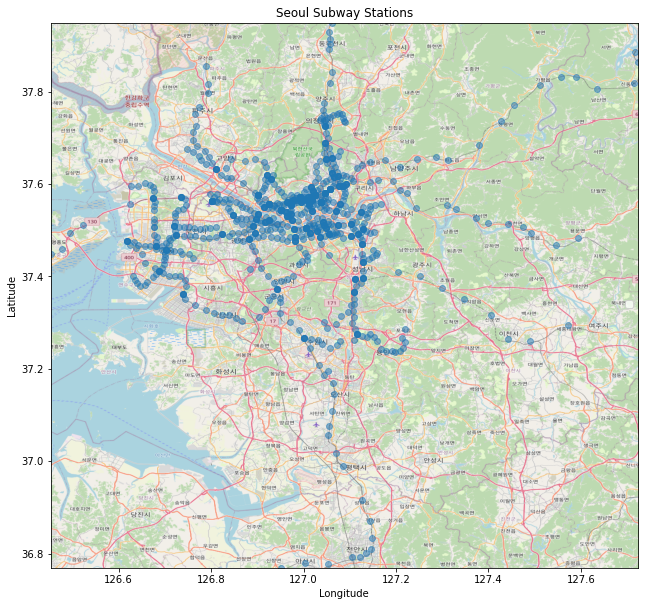

In [252]:
map_img = plt.imread('map_seoul.png')
fig, ax = plt.subplots(figsize = (10.53,12.22))
ax.scatter(station_info['y_xgs'], station_info['y_xgs'], zorder=1,c='b', s=100)
ax.set_xlim(boundingbox[0],boundingbox[1])
ax.set_ylim(boundingbox[2],boundingbox[3])
ax.set_title("Seoul Subway Stations")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.imshow(map_img, zorder=0, extent = boundingbox, aspect= 'equal')
ax.plot(station_info['y_xgs'], station_info['x_xgs'], 'o', alpha=0.5)
ax.legend(bbox_to_anchor=(1,.5))

# Merging station data with boarding data

In [59]:
station_boarding = pd.merge(daily_timely_boarding, station_info)
station_boarding

,USE_DT,subway_station_code,subway_station_name,division,05~06,06~07,07~08,08~09,09~10,10~11,...,22~23,23~24,24~,line,external_code,cyber_station,x_coordinate,y_coordinate,x_xgs,y_xgs
0,2015-01-01,2511,방화,승차,99,110,125,413,263,231,...,83,28,0,5,510,2511,458487.0,1132005.0,37.577446,126.812741
1,2015-01-02,2511,방화,승차,160,430,"1,173",883,505,390,...,118,66,17,5,510,2511,458487.0,1132005.0,37.577446,126.812741
2,2015-01-03,2511,방화,승차,107,176,267,412,382,421,...,104,40,1,5,510,2511,458487.0,1132005.0,37.577446,126.812741
3,2015-01-04,2511,방화,승차,96,124,179,264,361,396,...,98,38,4,5,510,2511,458487.0,1132005.0,37.577446,126.812741
4,2015-01-05,2511,방화,승차,182,604,"1,556","1,144",557,451,...,119,66,16,5,510,2511,458487.0,1132005.0,37.577446,126.812741
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
619269,2018-12-30 00:00:00,2827,모란,하차,14,44,36,62,85,86,...,123,75,11,8,826,1853,528402.0,1091947.0,37.432130,127.129087
619270,2018-12-31 00:00:00,2827,모란,승차,55,84,284,425,202,219,...,139,94,189,8,826,1853,528402.0,1091947.0,37.432130,127.129087
619271,2018-12-31 00:00:00,2827,모란,승차,55,84,284,425,202,219,...,139,94,189,8,826,1853,528402.0,1091947.0,37.432130,127.129087
619272,2018-12-31 00:00:00,2827,모란,하차,15,87,133,329,194,144,...,185,113,828,8,826,1853,528402.0,1091947.0,37.432130,127.129087


In [222]:
stationboarding_byhour = station_boarding.iloc[:,[1,4,5,6,7,8,9,10,11,12,13,14,16,17,18,19,20,21,22,23]].groupby('subway_station_code').sum()
stationboarding_byhour = stationboarding_byhour.merge(station_boarding[['subway_station_code', 'x_xgs', 'y_xgs']].drop_duplicates(), how='left', on='subway_station_code')
stationboarding_byhour

,subway_station_code,05~06,06~07,07~08,08~09,09~10,10~11,11~12,12~13,13~14,...,17~18,18~19,19~20,20~21,21~22,22~23,23~24,24~,x_xgs,y_xgs
0,151,330406,1261452,3794038,9149376,4546678,3014954,3185214,3221658,3828292,...,5056964,8613624,4554286,3285062,3312270,2267802,936458,143854,37.564718,126.977108
1,152,230130,799142,2658475,6829027,4096865,2405916,2559996,2671129,3135010,...,4615482,7741133,4571554,3212415,3477960,2862726,1409064,203914,37.570161,126.982923
2,153,630000,1271226,2684865,7062456,8107527,7763283,9160464,10218708,11309235,...,11251989,13373217,9809031,6196128,6328239,5245863,2517381,513834,37.571607,126.991806
3,154,139120,470905,1154545,3167468,2193507,1989809,2348314,2551668,2741401,...,2945140,3752905,2330760,1388826,1131585,854056,374021,55429,37.570926,127.001849
4,155,866096,978104,1643434,2821122,2724742,2646562,2963522,3269982,3389042,...,3267864,3254536,2814976,2177064,1827284,1624292,1140242,300476,37.571420,127.009745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234,2823,285063,655297,1816489,2541281,1543058,986486,820534,897119,909922,...,1223299,1669718,1363234,927749,863403,847366,499478,141444,37.451535,127.159816
235,2824,517140,1103650,2772778,3789140,2050229,1414963,1315299,1483477,1458152,...,2109664,3061724,2563551,1797456,1595633,1484339,921057,261603,37.445210,127.156866
236,2825,259096,468133,891131,1193297,834464,641636,639829,736103,818797,...,1109509,1266029,1109835,784846,707501,591310,368052,111520,37.440918,127.147564
237,2826,203486,418335,956454,1513758,907884,688204,721136,742697,845607,...,1055664,1154104,958240,652427,608176,538536,308084,100741,37.437428,127.140722


Text(0, 0.5, 'Approx. # of riders 2015-2018')

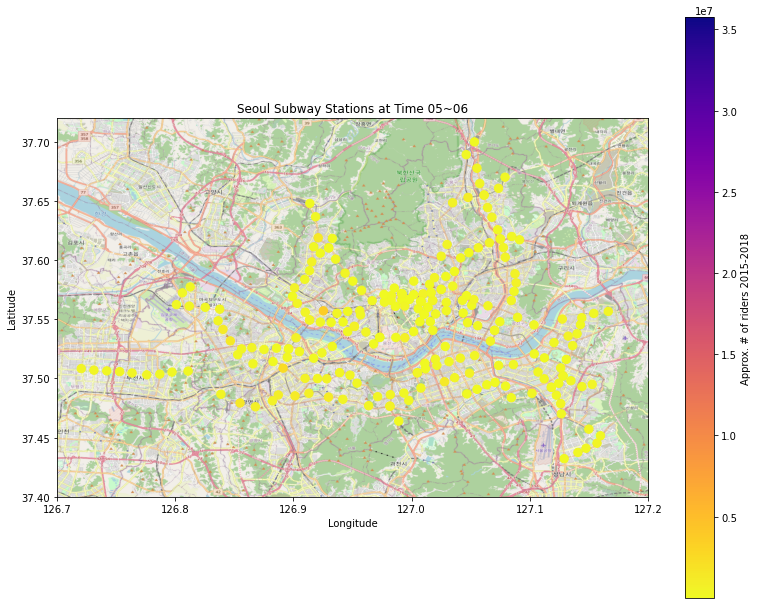

In [249]:
boundingbox_zoom = (126.7, 127.2, 37.4, 37.72)

map_img = plt.imread('map_zoom.png')
fig, ax = plt.subplots(figsize = (13.24,10.68))

ax.set_xlim(boundingbox_zoom[0],boundingbox_zoom[1])
ax.set_ylim(boundingbox_zoom[2],boundingbox_zoom[3])
ax.set_title("Seoul Subway Stations at Time " + stationboarding_byhour.columns.values[1])
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.imshow(map_img, zorder=0, extent = boundingbox_zoom, aspect= 'equal')

vmin=stationboarding_byhour.iloc[:,1:20].min().min()
vmax=stationboarding_byhour.iloc[:,1:20].max().max()

points = ax.scatter(stationboarding_byhour['y_xgs'], stationboarding_byhour['x_xgs'], marker='o', zorder=1, c=stationboarding_byhour.iloc[:,1], s=70, cmap="plasma_r", norm=plt.Normalize(vmin,vmax))
cbar = fig.colorbar(points)
cbar.ax.set_ylabel('Approx. # of riders 2015-2018')

#fig.savefig('figure', dpi=200, bbox_inches='tight', facecolor='white')

# Iterate through all times

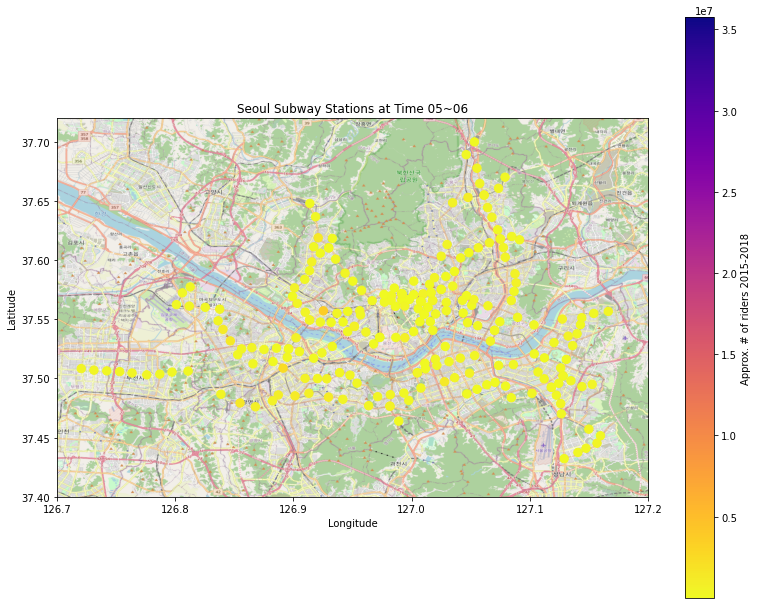

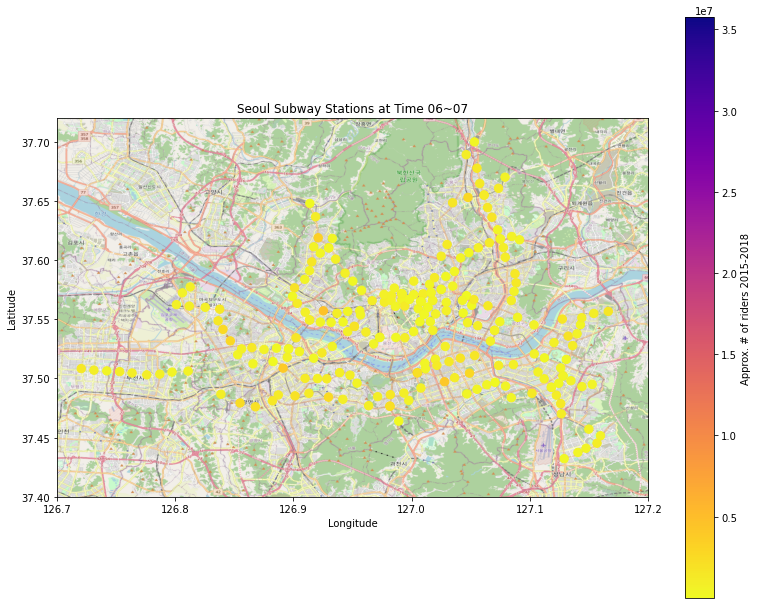

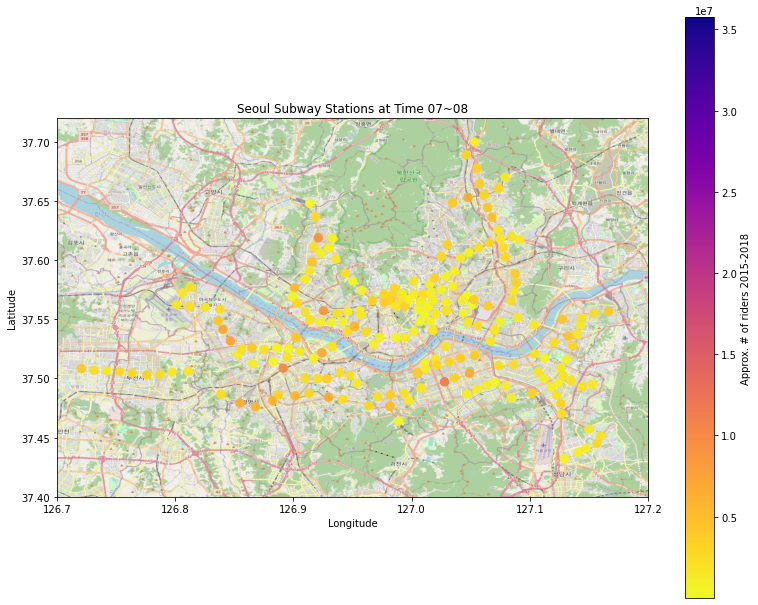

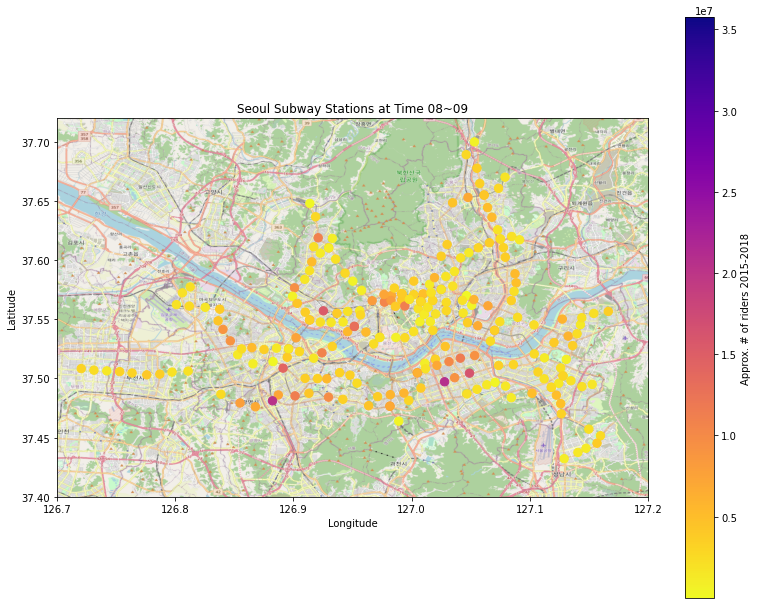

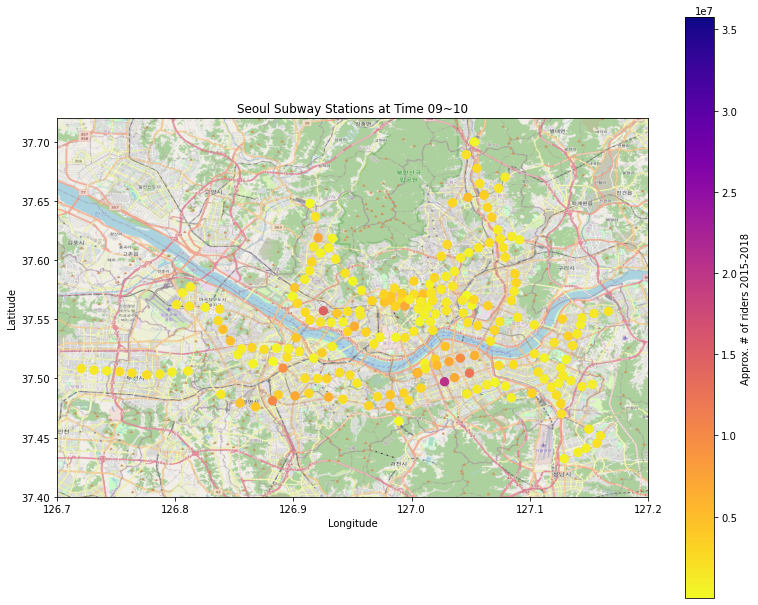

...

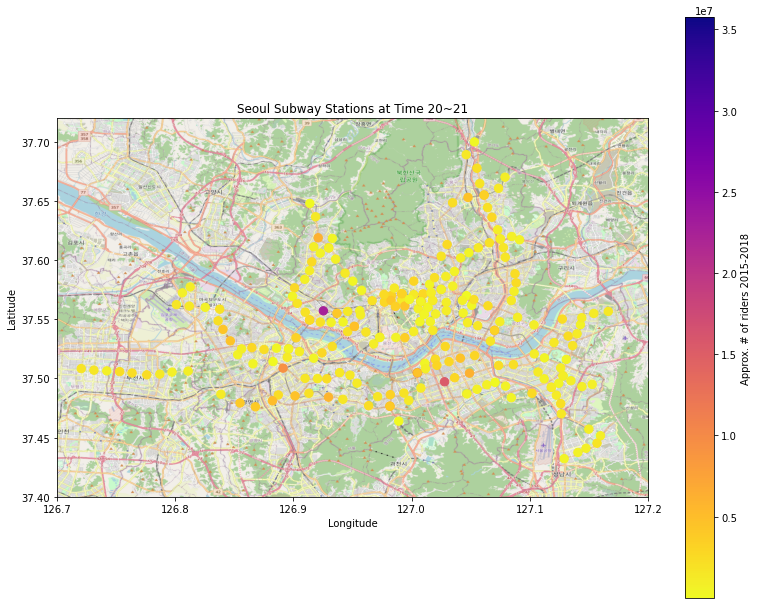

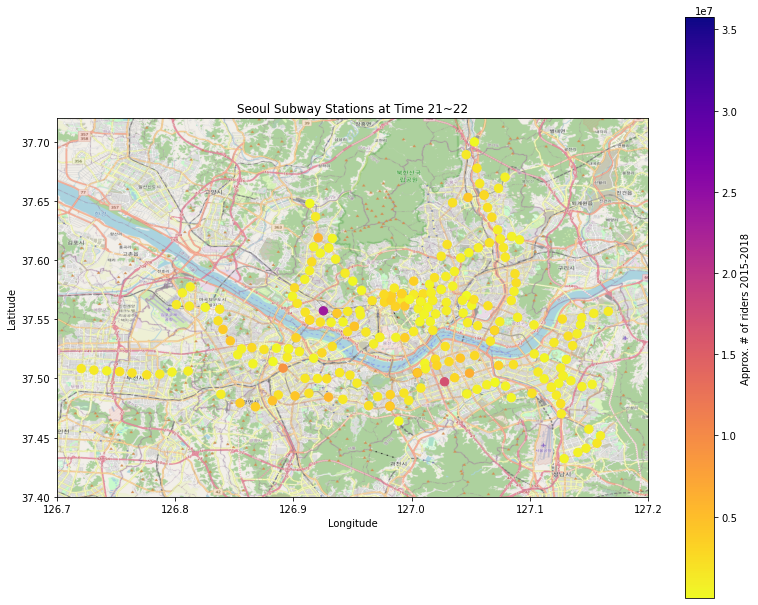

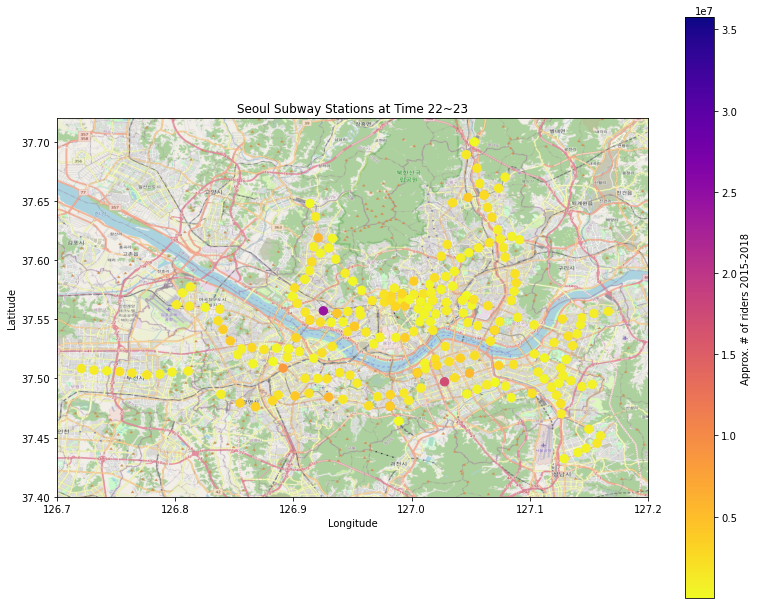

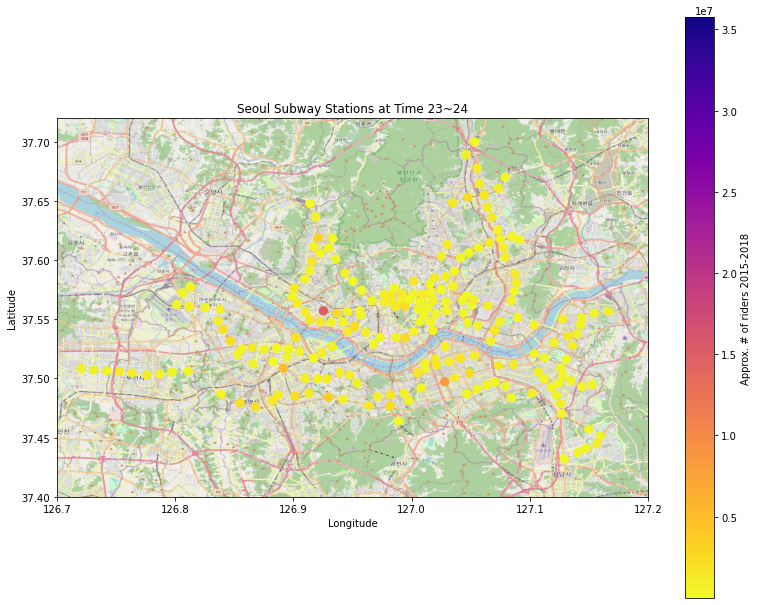

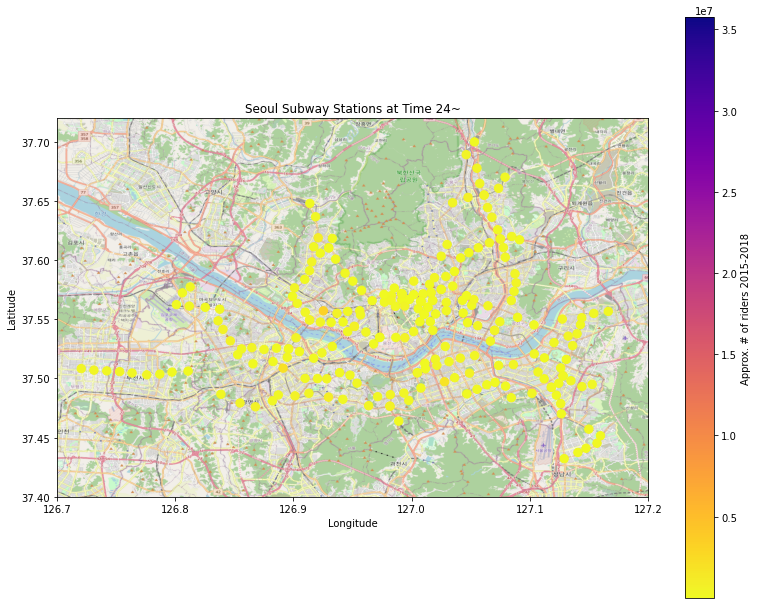

In [251]:
boundingbox_zoom = (126.7, 127.2, 37.4, 37.72)
map_img = plt.imread('map_zoom.png')

vmin=stationboarding_byhour.iloc[:,1:20].min().min()
vmax=stationboarding_byhour.iloc[:,1:20].max().max()

for i in range(1,20):

    fig, ax = plt.subplots(figsize = (13.24,10.68))

    ax.set_xlim(boundingbox_zoom[0],boundingbox_zoom[1])
    ax.set_ylim(boundingbox_zoom[2],boundingbox_zoom[3])
    ax.set_title("Seoul Subway Stations at Time " + stationboarding_byhour.columns.values[i])
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.imshow(map_img, zorder=0, extent = boundingbox_zoom, aspect= 'equal')

    points = ax.scatter(stationboarding_byhour['y_xgs'], stationboarding_byhour['x_xgs'], marker='o', zorder=1, c=stationboarding_byhour.iloc[:,i], s=70, cmap="plasma_r", norm=plt.Normalize(vmin,vmax))
    cbar = fig.colorbar(points)
    cbar.ax.set_ylabel('Approx. # of riders 2015-2018')

    fig.savefig(str(i)+'_figure', dpi=200, bbox_inches='tight', facecolor='white')